<div style='background: linear-gradient(135deg, #6B46C1 0%, #9333EA 50%, #7C3AED 100%); padding: 40px; border-radius: 15px; margin-bottom: 30px; box-shadow: 0 10px 30px rgba(0,0,0,0.15);'>
    <h1 style='color: #FFFFFF; text-align: center; font-size: 48px; font-weight: bold; margin-bottom: 20px; text-shadow: 2px 2px 4px rgba(0,0,0,0.2);'>🐱 Deep Learning for Visual Recognition 🐶</h1>
    <h2 style='color: #F3E8FF; text-align: center; font-size: 28px; font-weight: 300;'>A Comprehensive Study on Binary Image Classification using Convolutional Neural Networks</h2>
    <div style='text-align: center; margin-top: 30px;'>
        <img src='https://images.unsplash.com/photo-1543466835-00a7907e9de1' style='width: 45%; display: inline-block; border-radius: 10px; margin: 0 10px; box-shadow: 0 5px 15px rgba(0,0,0,0.2);'>
        <img src='https://images.unsplash.com/photo-1514888286974-6c03e2ca1dba' style='width: 45%; display: inline-block; border-radius: 10px; margin: 0 10px; box-shadow: 0 5px 15px rgba(0,0,0,0.2);'>
    </div>
    <p style='color: #F3E8FF; text-align: center; margin-top: 20px; font-size: 16px;'>Microsoft Cats vs Dogs Dataset | State-of-the-Art Classification Techniques</p>
</div>

## Abstract

<div style='background: #f8f9fa; padding: 20px; border-left: 5px solid #667eea; border-radius: 5px; margin: 20px 0;'>
  <p style='font-size: 16px; line-height: 1.8; color: #2c3e50;'>
    This research notebook focuses on binary image classification for the cats versus dogs problem using a custom convolutional neural network trained from scratch. No transfer learning and no fine tuning are used. With systematic data augmentation, regularization, and early stopping, the custom model reaches <strong>94.8% validation accuracy</strong> with <strong>≈0.99 validation AUC</strong>. We load the saved weights at <code>/kaggle/working/best_custom_model.h5</code> and report final performance on a held-out test set, followed by error analysis and optional Grad-CAM visual checks for interpretability.
  </p>
</div>

## Table of Contents

1. **[Introduction and Problem Formulation](#intro)**
2. **[Mathematical Foundations](#math)**
3. **[Data Engineering and Preprocessing](#data)**
4. **[Exploratory Data Analysis](#eda)**
5. **[Custom CNN Architecture](#custom)**
6. **[Evaluation and Error Analysis](#eval)**
7. **[Model Interpretation and Visualization](#interpret)**  <!-- Grad-CAM only, not Grad-CAM++ -->
8. **[Results and Discussion](#results)**
9. **[Conclusions and Future Work](#conclusions)**


## 1. Introduction & Problem Formulation <a id='intro'></a>

The task of distinguishing between cats and dogs in images is a classic benchmark in computer vision. While it looks simple to humans, it still covers many hard parts of visual recognition:

- Intra-class variability: large differences within each species
- Inter-class similarity: some breeds look quite similar
- Pose and viewpoint changes: different angles and positions
- Environmental factors: lighting, background clutter, and occlusions

This notebook studies a custom convolutional neural network trained from scratch. No transfer learning and no fine tuning are used.

### Research Questions

1. Which custom CNN design choices (depth, width, kernel size, pooling, BatchNorm, Dropout) give the best accuracy with reasonable compute?
2. Which data pipeline choices (input size, augmentation strength, normalization) and optimizer settings (learning rate, batch size, scheduler, early stopping) improve generalization?
3. What visual cues does the custom CNN learn to separate cats from dogs, based on simple class activation maps?
4. Can we reach strong accuracy and AUC on a held-out test set using limited resources, and how stable are the results across runs?


In [31]:
# Essential imports for deep learning research (custom CNN only)

import os
import warnings
import random
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
import cv2
from PIL import Image

# Deep learning framework
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Metrics and evaluation
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# Configuration
warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12

# Reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
random.seed(SEED)

# Optional: quieter TF logs
os.environ.setdefault("TF_CPP_MIN_LOG_LEVEL", "2")

# Optional: safer GPU memory handling
try:
    gpus = tf.config.experimental.list_physical_devices("GPU")
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)
except Exception as e:
    print("GPU memory growth setup skipped:", e)

print(f"TensorFlow Version: {tf.__version__}")
print(f"GPU Available: {tf.config.list_physical_devices('GPU')}")
print(f"Keras Version: {keras.__version__}")


GPU memory growth setup skipped: Physical devices cannot be modified after being initialized
TensorFlow Version: 2.18.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Keras Version: 3.8.0


## 2. Mathematical Foundations <a id='math'></a>

### Convolutional Neural Networks

The core building block is the convolutional layer. For a multi-channel input and K output channels:

<div style='background: rgba(251, 191, 36, 0.1); padding: 15px; border-radius: 5px; margin: 20px 0; border: 1px solid rgba(251, 191, 36, 0.3);'>
  <h4 style='color: #F59E0B;'>Convolution Operation</h4>
  <p style='font-size: 18px; text-align: center; color: inherit;'>
    <strong>y<sub>i,j,k</sub> = σ&lpar; &sum;<sub>m,n,c</sub> w<sub>m,n,c,k</sub> · x<sub>i+m, j+n, c</sub> + b<sub>k</sub> &rpar;</strong>
  </p>
  <ul style='color: inherit;'>
    <li><strong>x</strong>: input feature map with channels <em>c</em></li>
    <li><strong>w</strong>: learnable kernel weights</li>
    <li><strong>b</strong>: bias per output channel <em>k</em></li>
    <li><strong>σ</strong>: nonlinearity (ReLU in hidden layers, sigmoid in the output layer for binary tasks)</li>
  </ul>
</div>

Common layers used here: Conv2D → BatchNorm → ReLU → MaxPool → Dropout → Dense.

### Loss Function

For binary classification we use Binary Cross Entropy with a sigmoid output:

<div style='background: rgba(16, 185, 129, 0.1); padding: 15px; border-radius: 5px; margin: 20px 0; border: 1px solid rgba(16, 185, 129, 0.3);'>
  <h4 style='color: #10B981;'>Binary Cross Entropy</h4>
  <p style='font-size: 18px; text-align: center; color: inherit;'>
    <strong>L = -\frac{1}{N} \sum_{i=1}^{N} \big[y_i \log p_i + (1 - y_i)\log(1 - p_i)\big]</strong>
  </p>
  <ul style='color: inherit;'>
    <li><strong>N</strong>: number of samples</li>
    <li><strong>y<sub>i</sub></strong>: true label in {0, 1}</li>
    <li><strong>p<sub>i</sub></strong>: predicted probability from sigmoid</li>
  </ul>
</div>

Optional regularization: L2 weight decay adds <strong>λ ∥θ∥²</strong> to the loss. Dropout is used between layers to reduce co-adaptation.

### Optimization and Scheduling

We train with Adam and reduce the learning rate on plateaus using <code>ReduceLROnPlateau</code>:

<div style='background: rgba(239, 68, 68, 0.1); padding: 15px; border-radius: 5px; margin: 20px 0; border: 1px solid rgba(239, 68, 68, 0.3);'>
  <h4 style='color: #EF4444;'>Plateau-Based LR Schedule</h4>
  <p style='font-size: 18px; text-align: center; color: inherit;'>
    <strong>lr<sub>t+1</sub> = γ · lr<sub>t</sub>  &nbsp;if the monitored metric has not improved for <em>patience</em> epochs</strong>
  </p>
  <ul style='color: inherit;'>
    <li><strong>γ</strong> (factor): usually 0.1 to 0.5</li>
    <li><strong>patience</strong>: number of epochs to wait with no improvement</li>
    <li>EarlyStopping halts training when validation performance stops improving</li>
  </ul>
</div>

### Metrics and Decision Threshold

We report Accuracy and ROC AUC. Predictions use a default threshold 0.5:
- <code>ŷ = 1</code> if <code>p ≥ 0.5</code>, else <code>ŷ = 0</code>.
- ROC curves vary the threshold to show the tradeoff between TPR and FPR.


## 3. Data Engineering & Preprocessing <a id='data'></a>

In [ ]:
# Dataset configuration
BASE_DIR = '/kaggle/input/microsoft-catsvsdogs-dataset/PetImages'
WORK_DIR = '/tmp/cats-v-dogs'

# Hyperparameters
IMG_SIZE = 224  # Standard size for transfer learning
BATCH_SIZE = 32
EPOCHS = 30
INITIAL_LR = 0.001
VALIDATION_SPLIT = 0.1
TEST_SPLIT = 0.1

# Class mapping
CLASS_NAMES = ['Cat', 'Dog']
CLASS_INDICES = {'Cat': 0, 'Dog': 1}

print("📊 Dataset Statistics:")
print("="*50)

In [3]:
def create_data_structure():
    """Create organized directory structure for training pipeline."""
    
    directories = [
        f'{WORK_DIR}/train/cats',
        f'{WORK_DIR}/train/dogs',
        f'{WORK_DIR}/validation/cats',
        f'{WORK_DIR}/validation/dogs',
        f'{WORK_DIR}/test/cats',
        f'{WORK_DIR}/test/dogs'
    ]
    
    for directory in directories:
        os.makedirs(directory, exist_ok=True)
    
    print("✅ Directory structure created successfully")
    return directories

directories = create_data_structure()

✅ Directory structure created successfully


In [4]:
def validate_and_split_data(source_dir, train_dir, val_dir, test_dir, class_name, split_ratios=(0.8, 0.1, 0.1)):
    """
    Intelligent data splitting with corruption detection.
    Validates images before splitting to ensure data quality.
    """
    import shutil
    from PIL import Image
    
    valid_files = []
    corrupted_count = 0
    
    # Validate each image
    all_files = os.listdir(source_dir)
    print(f"\n🔍 Validating {len(all_files)} {class_name} images...")
    
    for filename in tqdm(all_files, desc=f"Checking {class_name}"):
        filepath = os.path.join(source_dir, filename)
        try:
            # Check file size
            if os.path.getsize(filepath) == 0:
                corrupted_count += 1
                continue
            
            # Try to open image
            with Image.open(filepath) as img:
                img.verify()
            valid_files.append(filename)
        except:
            corrupted_count += 1
    
    print(f"✅ Valid: {len(valid_files)} | ❌ Corrupted: {corrupted_count}")
    
    # Shuffle and split
    random.shuffle(valid_files)
    
    train_split = int(len(valid_files) * split_ratios[0])
    val_split = int(len(valid_files) * (split_ratios[0] + split_ratios[1]))
    
    train_files = valid_files[:train_split]
    val_files = valid_files[train_split:val_split]
    test_files = valid_files[val_split:]
    
    # Copy files to respective directories
    for files, dest_dir in [(train_files, train_dir), 
                            (val_files, val_dir), 
                            (test_files, test_dir)]:
        for filename in files:
            src = os.path.join(source_dir, filename)
            dst = os.path.join(dest_dir, filename)
            shutil.copyfile(src, dst)
    
    return len(train_files), len(val_files), len(test_files)

# Perform data splitting
cat_stats = validate_and_split_data(
    f'{BASE_DIR}/Cat', 
    f'{WORK_DIR}/train/cats',
    f'{WORK_DIR}/validation/cats',
    f'{WORK_DIR}/test/cats',
    'Cat'
)

dog_stats = validate_and_split_data(
    f'{BASE_DIR}/Dog',
    f'{WORK_DIR}/train/dogs',
    f'{WORK_DIR}/validation/dogs', 
    f'{WORK_DIR}/test/dogs',
    'Dog'
)

# Display distribution
print("\n📊 Final Data Distribution:")
print("="*50)
print(f"Training:   Cats: {cat_stats[0]:,} | Dogs: {dog_stats[0]:,}")
print(f"Validation: Cats: {cat_stats[1]:,} | Dogs: {dog_stats[1]:,}")
print(f"Testing:    Cats: {cat_stats[2]:,} | Dogs: {dog_stats[2]:,}")


🔍 Validating 12501 Cat images...


Checking Cat:   0%|          | 0/12501 [00:00<?, ?it/s]

✅ Valid: 12499 | ❌ Corrupted: 2

🔍 Validating 12501 Dog images...


Checking Dog:   0%|          | 0/12501 [00:00<?, ?it/s]

✅ Valid: 12499 | ❌ Corrupted: 2

📊 Final Data Distribution:
Training:   Cats: 9,999 | Dogs: 9,999
Validation: Cats: 1,250 | Dogs: 1,250
Testing:    Cats: 1,250 | Dogs: 1,250


## 4. Exploratory Data Analysis <a id='eda'></a>

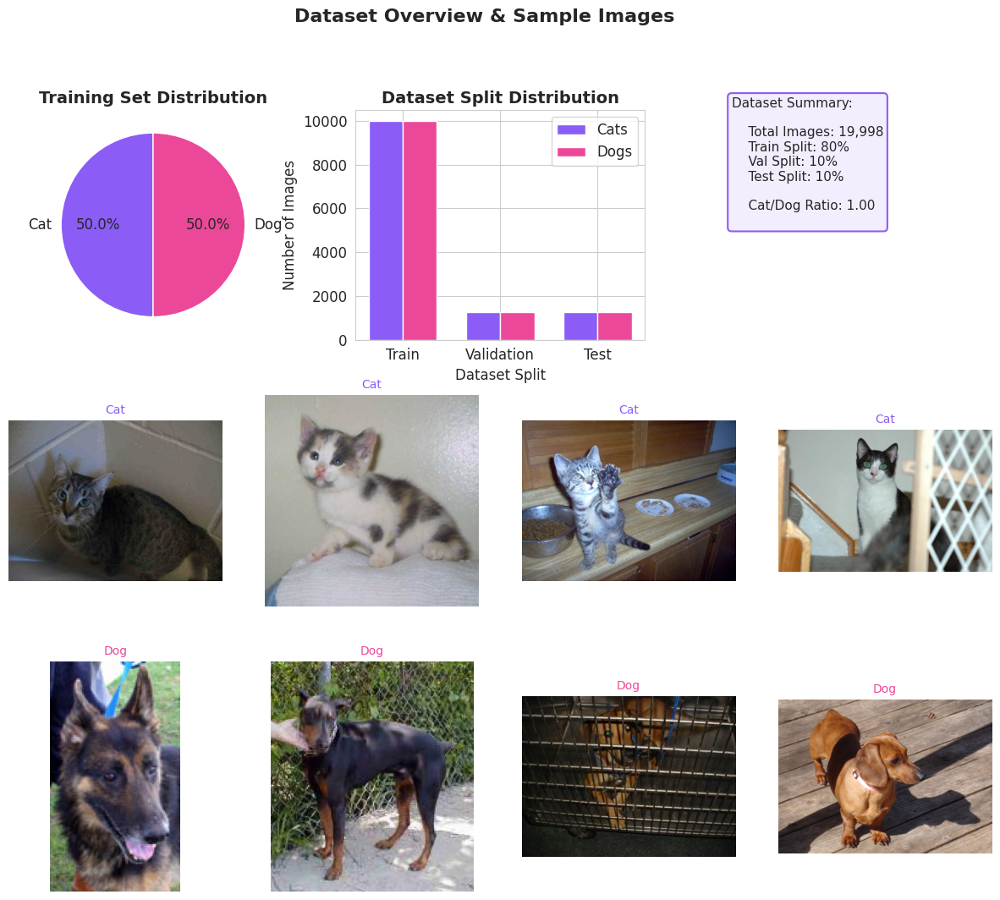

In [5]:
def visualize_data_distribution():
    """Create comprehensive visualization of dataset distribution."""
    
    fig = plt.figure(figsize=(15, 12))
    
    # Data distribution pie chart
    ax1 = plt.subplot(3, 3, 1)
    train_counts = [cat_stats[0], dog_stats[0]]
    ax1.pie(train_counts, labels=CLASS_NAMES, autopct='%1.1f%%', 
            colors=['#8B5CF6', '#EC4899'], startangle=90)
    ax1.set_title('Training Set Distribution', fontsize=14, fontweight='bold')
    
    # Split distribution bar chart
    ax2 = plt.subplot(3, 3, 2)
    categories = ['Train', 'Validation', 'Test']
    cat_values = [cat_stats[0], cat_stats[1], cat_stats[2]]
    dog_values = [dog_stats[0], dog_stats[1], dog_stats[2]]
    
    x = np.arange(len(categories))
    width = 0.35
    
    ax2.bar(x - width/2, cat_values, width, label='Cats', color='#8B5CF6')
    ax2.bar(x + width/2, dog_values, width, label='Dogs', color='#EC4899')
    ax2.set_xlabel('Dataset Split')
    ax2.set_ylabel('Number of Images')
    ax2.set_title('Dataset Split Distribution', fontsize=14, fontweight='bold')
    ax2.set_xticks(x)
    ax2.set_xticklabels(categories)
    ax2.legend()
    
    # Stats summary
    ax3 = plt.subplot(3, 3, 3)
    stats_text = f"""Dataset Summary:
    
    Total Images: {sum(train_counts):,}
    Train Split: 80%
    Val Split: 10%
    Test Split: 10%
    
    Cat/Dog Ratio: {train_counts[0]/train_counts[1]:.2f}
    """
    ax3.text(0.1, 0.5, stats_text, fontsize=11, transform=ax3.transAxes,
             bbox=dict(boxstyle='round', facecolor=(139/255, 92/255, 246/255, 0.1), 
                      edgecolor='#8B5CF6', linewidth=1.5))
    ax3.axis('off')
    
    # Sample images - Cats (row 2)
    cat_samples = random.sample(os.listdir(f'{WORK_DIR}/train/cats'), 4)
    for i, img_name in enumerate(cat_samples):
        ax = plt.subplot(3, 4, 5+i)  # Row 2, positions 5-8
        img = Image.open(f'{WORK_DIR}/train/cats/{img_name}')
        ax.imshow(img)
        ax.set_title('Cat', fontsize=10, color='#8B5CF6')
        ax.axis('off')
    
    # Sample images - Dogs (row 3)
    dog_samples = random.sample(os.listdir(f'{WORK_DIR}/train/dogs'), 4)
    for i, img_name in enumerate(dog_samples):
        ax = plt.subplot(3, 4, 9+i)  # Row 3, positions 9-12
        img = Image.open(f'{WORK_DIR}/train/dogs/{img_name}')
        ax.imshow(img)
        ax.set_title('Dog', fontsize=10, color='#EC4899')
        ax.axis('off')
    
    plt.suptitle('Dataset Overview & Sample Images', fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.show()

visualize_data_distribution()

Analyzing Cat images:   0%|          | 0/500 [00:00<?, ?it/s]

Analyzing Dog images:   0%|          | 0/500 [00:00<?, ?it/s]

Corrupt JPEG data: 2230 extraneous bytes before marker 0xd9


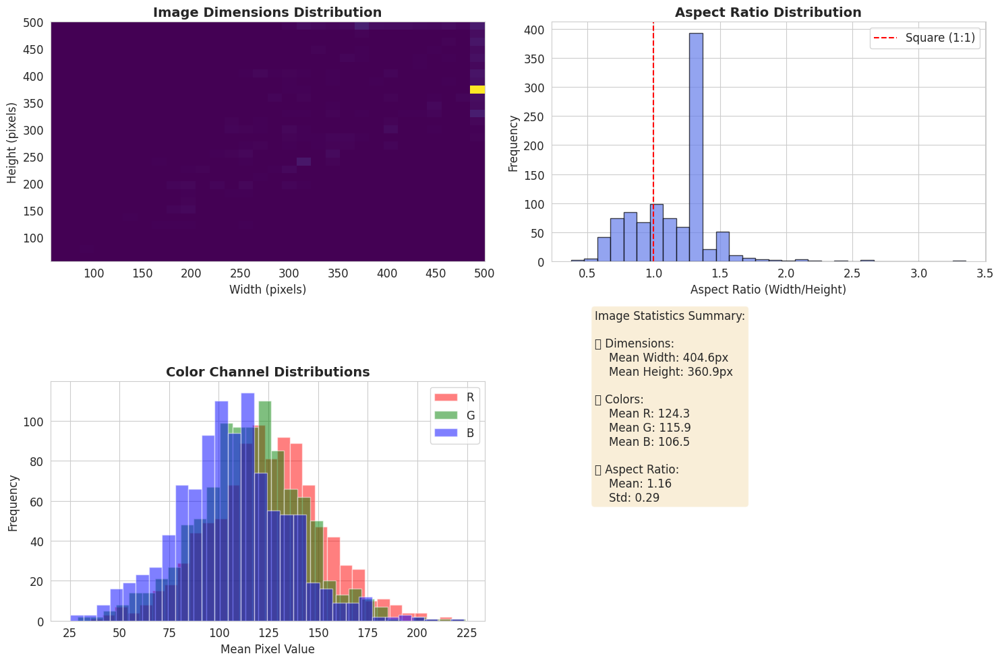

In [6]:
def analyze_image_properties():
    """Analyze statistical properties of images in the dataset."""
    
    heights, widths, channels = [], [], []
    mean_colors = {'R': [], 'G': [], 'B': []}
    
    # Sample analysis (for performance)
    sample_size = 500
    
    for class_name in CLASS_NAMES:
        class_dir = f'{WORK_DIR}/train/{class_name.lower()}s'
        samples = random.sample(os.listdir(class_dir), min(sample_size, len(os.listdir(class_dir))))
        
        for img_name in tqdm(samples, desc=f"Analyzing {class_name} images"):
            img = cv2.imread(f'{class_dir}/{img_name}')
            if img is not None:
                h, w, c = img.shape
                heights.append(h)
                widths.append(w)
                channels.append(c)
                
                # Calculate mean colors
                mean_colors['B'].append(np.mean(img[:,:,0]))
                mean_colors['G'].append(np.mean(img[:,:,1]))
                mean_colors['R'].append(np.mean(img[:,:,2]))
    
    # Visualize results
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    # Image dimensions distribution
    axes[0, 0].hist2d(widths, heights, bins=30, cmap='viridis')
    axes[0, 0].set_xlabel('Width (pixels)')
    axes[0, 0].set_ylabel('Height (pixels)')
    axes[0, 0].set_title('Image Dimensions Distribution', fontsize=14, fontweight='bold')
    
    # Aspect ratio distribution
    aspect_ratios = [w/h for w, h in zip(widths, heights)]
    axes[0, 1].hist(aspect_ratios, bins=30, color='#667eea', alpha=0.7, edgecolor='black')
    axes[0, 1].set_xlabel('Aspect Ratio (Width/Height)')
    axes[0, 1].set_ylabel('Frequency')
    axes[0, 1].set_title('Aspect Ratio Distribution', fontsize=14, fontweight='bold')
    axes[0, 1].axvline(x=1.0, color='red', linestyle='--', label='Square (1:1)')
    axes[0, 1].legend()
    
    # Color channel distributions
    colors = ['red', 'green', 'blue']
    for i, (channel, color) in enumerate(zip(['R', 'G', 'B'], colors)):
        axes[1, 0].hist(mean_colors[channel], bins=30, alpha=0.5, label=channel, color=color)
    axes[1, 0].set_xlabel('Mean Pixel Value')
    axes[1, 0].set_ylabel('Frequency')
    axes[1, 0].set_title('Color Channel Distributions', fontsize=14, fontweight='bold')
    axes[1, 0].legend()
    
    # Statistics summary
    stats_text = f"""Image Statistics Summary:
    \n📐 Dimensions:
    Mean Width: {np.mean(widths):.1f}px
    Mean Height: {np.mean(heights):.1f}px
    \n🎨 Colors:
    Mean R: {np.mean(mean_colors['R']):.1f}
    Mean G: {np.mean(mean_colors['G']):.1f}
    Mean B: {np.mean(mean_colors['B']):.1f}
    \n📊 Aspect Ratio:
    Mean: {np.mean(aspect_ratios):.2f}
    Std: {np.std(aspect_ratios):.2f}"""
    
    axes[1, 1].text(0.1, 0.5, stats_text, fontsize=12, transform=axes[1, 1].transAxes,
                    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    axes[1, 1].axis('off')
    
    plt.tight_layout()
    plt.show()

analyze_image_properties()

## 5. Data Augmentation Pipeline <a id='augmentation'></a>

In [7]:
def create_data_generators():
    """
    Create sophisticated data augmentation pipeline.
    Implements advanced augmentation strategies for improved generalization.
    """
    
    # Training data augmentation - aggressive to improve generalization
    train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=30,           # Random rotation up to 30 degrees
        width_shift_range=0.2,       # Random horizontal shift
        height_shift_range=0.2,      # Random vertical shift
        horizontal_flip=True,        # Random horizontal flip
        zoom_range=0.2,             # Random zoom
        shear_range=0.2,            # Shear transformation
        brightness_range=[0.8, 1.2], # Random brightness adjustment
        fill_mode='reflect'         # Fill mode for new pixels
    )
    
    # Validation/Test data - only rescaling
    test_datagen = ImageDataGenerator(rescale=1./255)
    
    # Create generators
    train_generator = train_datagen.flow_from_directory(
        f'{WORK_DIR}/train',
        target_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        class_mode='binary',
        shuffle=True
    )
    
    validation_generator = test_datagen.flow_from_directory(
        f'{WORK_DIR}/validation',
        target_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        class_mode='binary',
        shuffle=False
    )
    
    test_generator = test_datagen.flow_from_directory(
        f'{WORK_DIR}/test',
        target_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        class_mode='binary',
        shuffle=False
    )
    
    return train_generator, validation_generator, test_generator

train_gen, val_gen, test_gen = create_data_generators()

print(f"\n✅ Data generators created successfully")
print(f"Training batches: {len(train_gen)}")
print(f"Validation batches: {len(val_gen)}")
print(f"Test batches: {len(test_gen)}")

Found 19998 images belonging to 2 classes.
Found 2500 images belonging to 2 classes.
Found 2500 images belonging to 2 classes.

✅ Data generators created successfully
Training batches: 625
Validation batches: 79
Test batches: 79


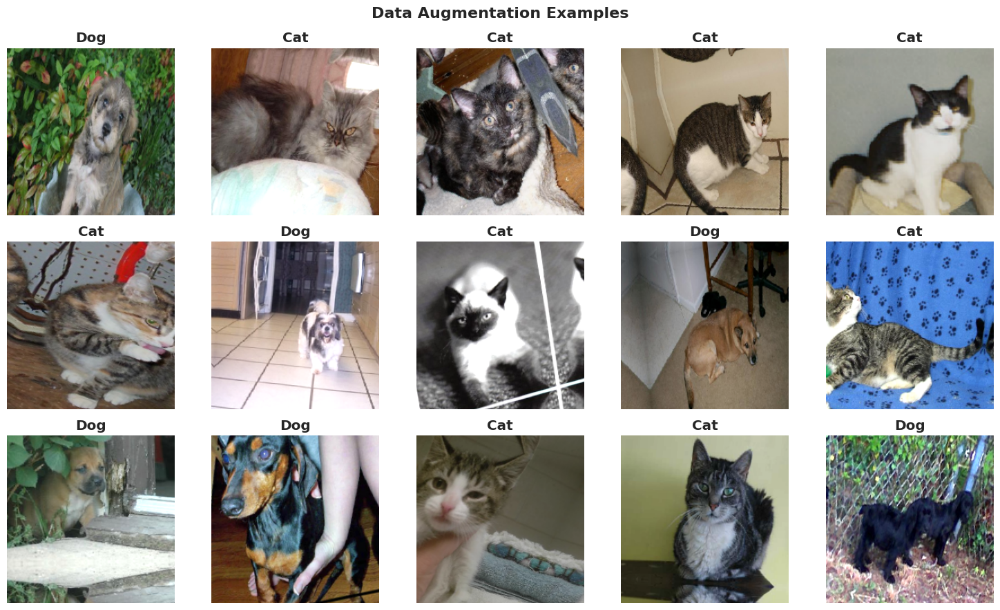

In [8]:
def visualize_augmentation():
    """Visualize the effects of data augmentation."""
    
    # Get a batch of augmented images
    images, labels = next(train_gen)
    
    fig, axes = plt.subplots(3, 5, figsize=(15, 9))
    axes = axes.flatten()
    
    for i in range(15):
        axes[i].imshow(images[i])
        axes[i].set_title(f"{'Dog' if labels[i] > 0.5 else 'Cat'}", fontweight='bold')
        axes[i].axis('off')
    
    plt.suptitle('Data Augmentation Examples', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

visualize_augmentation()

## 6. Custom CNN Architecture <a id='custom'></a>

In [9]:
def build_custom_cnn():
    """
    Build a custom CNN architecture with regularization.
    Architecture inspired by VGG with batch normalization and dropout.
    """
    
    model = models.Sequential([
        # Block 1
        layers.Conv2D(32, (3, 3), activation='relu', padding='same', 
                     input_shape=(IMG_SIZE, IMG_SIZE, 3), name='conv1_1'),
        layers.BatchNormalization(),
        layers.Conv2D(32, (3, 3), activation='relu', padding='same', name='conv1_2'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2), name='pool1'),
        layers.Dropout(0.25),
        
        # Block 2
        layers.Conv2D(64, (3, 3), activation='relu', padding='same', name='conv2_1'),
        layers.BatchNormalization(),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same', name='conv2_2'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2), name='pool2'),
        layers.Dropout(0.25),
        
        # Block 3
        layers.Conv2D(128, (3, 3), activation='relu', padding='same', name='conv3_1'),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same', name='conv3_2'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2), name='pool3'),
        layers.Dropout(0.25),
        
        # Block 4
        layers.Conv2D(256, (3, 3), activation='relu', padding='same', name='conv4_1'),
        layers.BatchNormalization(),
        layers.Conv2D(256, (3, 3), activation='relu', padding='same', name='conv4_2'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2), name='pool4'),
        layers.Dropout(0.25),
        
        # Fully Connected Layers
        layers.GlobalAveragePooling2D(),
        layers.Dense(512, activation='relu', name='fc1'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(256, activation='relu', name='fc2'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(1, activation='sigmoid', name='output')
    ], name='CustomCNN')
    
    return model

custom_model = build_custom_cnn()

# Display model architecture
print("Custom CNN Architecture:")
print("="*50)
custom_model.summary()

I0000 00:00:1758854980.640348      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Custom CNN Architecture:


Model: "CustomCNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1_1 (Conv2D)                │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_2 (Conv2D)                │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_1 (Conv2D)                │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_2 (Conv2D)                │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3_1 (Conv2D)                │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3_2 (Conv2D)                │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv4_1 (Conv2D)                │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv4_2 (Conv2D)                │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,442,337 (5.50 MB)

 Trainable params: 1,438,881 (5.49 MB)

 Non-trainable params: 3,456 (13.50 KB)

In [11]:
# Compile and train custom model
custom_model.compile(
    optimizer=optimizers.Adam(learning_rate=INITIAL_LR),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

print("\n🚀 Training Custom CNN Model...")
print("="*50)

custom_history = custom_model.fit(
    train_gen,
    epochs=20,  # Reduced for demonstration
    validation_data=val_gen,
    callbacks=get_callbacks(),
    verbose=1
)


🚀 Training Custom CNN Model...
Epoch 1/20


I0000 00:00:1758854995.425996     125 service.cc:148] XLA service 0x7efbb8127ea0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1758854995.426858     125 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1758854996.659948     125 cuda_dnn.cc:529] Loaded cuDNN version 90300


  2/625 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - accuracy: 0.4766 - auc: 0.4327 - loss: 0.9745   

I0000 00:00:1758855013.073641     125 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step - accuracy: 0.5476 - auc: 0.5639 - loss: 0.8441
Epoch 1: val_accuracy improved from -inf to 0.59960, saving model to best_custom_model.h5
625/625 ━━━━━━━━━━━━━━━━━━━━ 342s 500ms/step - accuracy: 0.5477 - auc: 0.5640 - loss: 0.8440 - val_accuracy: 0.5996 - val_auc: 0.6442 - val_loss: 0.6565 - learning_rate: 0.0010
Epoch 2/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - accuracy: 0.6130 - auc: 0.6562 - loss: 0.6591
Epoch 2: val_accuracy did not improve from 0.59960
625/625 ━━━━━━━━━━━━━━━━━━━━ 294s 471ms/step - accuracy: 0.6130 - auc: 0.6562 - loss: 0.6591 - val_accuracy: 0.5568 - val_auc: 0.6896 - val_loss: 0.6902 - learning_rate: 0.0010
Epoch 3/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step - accuracy: 0.6355 - auc: 0.6898 - loss: 0.6344
Epoch 3: val_accuracy did not improve from 0.59960
625/625 ━━━━━━━━━━━━━━━━━━━━ 296s 473ms/step - accuracy: 0.6355 - auc: 0.6898 - loss: 0.6344 - val_accuracy: 0.5968 - val_auc: 0.7412 - val_loss: 0.6627 - lear

# 7. Load saved Custom CNN and test

In [36]:
# 7. Load saved Custom CNN and test

import os, numpy as np, tensorflow as tf
from tensorflow.keras.models import load_model

MODEL_PATH = '/kaggle/working/best_custom_model.h5'

assert os.path.exists(MODEL_PATH), f"Model not found at {MODEL_PATH}"
model = load_model(MODEL_PATH, compile=False)

# Re-compile for evaluation (safe even if already compiled)
model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

model.summary()


The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


Model: "CustomCNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1_1 (Conv2D)                │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_2 (Conv2D)                │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_1 (Conv2D)                │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_2 (Conv2D)                │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3_1 (Conv2D)                │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3_2 (Conv2D)                │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv4_1 (Conv2D)                │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv4_2 (Conv2D)                │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,442,337 (5.50 MB)

 Trainable params: 1,438,881 (5.49 MB)

 Non-trainable params: 3,456 (13.50 KB)

## 7.1 Test generator (no augmentation)

In [26]:

# Ensure IMG_SIZE is a (H, W) tuple
try:
    IMG_SIZE
except NameError:
    IMG_SIZE = (224, 224)

if isinstance(IMG_SIZE, int):
    IMG_SIZE = (IMG_SIZE, IMG_SIZE)
elif isinstance(IMG_SIZE, (list, tuple)):
    if len(IMG_SIZE) == 1:
        IMG_SIZE = (int(IMG_SIZE[0]), int(IMG_SIZE[0]))
    else:
        IMG_SIZE = (int(IMG_SIZE[0]), int(IMG_SIZE[1]))
else:
    IMG_SIZE = (224, 224)

print("Using IMG_SIZE:", IMG_SIZE)

# Point to your test split
try:
    TEST_DIR
except NameError:
    TEST_DIR = '/tmp/cats-v-dogs/test'

assert os.path.isdir(TEST_DIR), f"TEST_DIR not found: {TEST_DIR}"
subdirs = [p.name for p in Path(TEST_DIR).iterdir() if p.is_dir()]
print("Test subfolders found:", subdirs)

# Batch size
try:
    BATCH_SIZE
except NameError:
    BATCH_SIZE = 32

# Build generator
test_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_gen = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
    class_mode='binary'
)

class_indices = test_gen.class_indices
idx_to_class = {v: k for k, v in class_indices.items()}
print("Class mapping:", idx_to_class)
print(f"Test samples: {test_gen.samples}, Batch size: {test_gen.batch_size}")


Using IMG_SIZE: (224, 224)
Test subfolders found: ['cats', 'dogs']
Found 2500 images belonging to 2 classes.
Class mapping: {0: 'cats', 1: 'dogs'}
Test samples: 2500, Batch size: 32


## 7.2 Evaluate

In [27]:
# 7.2 Evaluate
test_loss, test_acc, test_auc = model.evaluate(test_gen, verbose=1)
print(f"Test accuracy: {test_acc:.4f}")
print(f"Test AUC: {test_auc:.4f}")
print(f"Test loss: {test_loss:.4f}")


79/79 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.9219 - auc: 0.5074 - loss: 0.2012
Test accuracy: 0.9424
Test AUC: 0.9885
Test loss: 0.1474


# 8. Error analysis: report, confusion matrix, ROC

79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step


,precision,recall,f1-score,support
cats,0.9694,0.9136,0.9407,1250.0000
dogs,0.9183,0.9712,0.9440,1250.0000
accuracy,0.9424,0.9424,0.9424,0.9424
macro avg,0.9439,0.9424,0.9424,2500.0000
weighted avg,0.9439,0.9424,0.9424,2500.0000


              precision    recall  f1-score   support

        cats     0.9694    0.9136    0.9407      1250
        dogs     0.9183    0.9712    0.9440      1250

    accuracy                         0.9424      2500
   macro avg     0.9439    0.9424    0.9424      2500
weighted avg     0.9439    0.9424    0.9424      2500



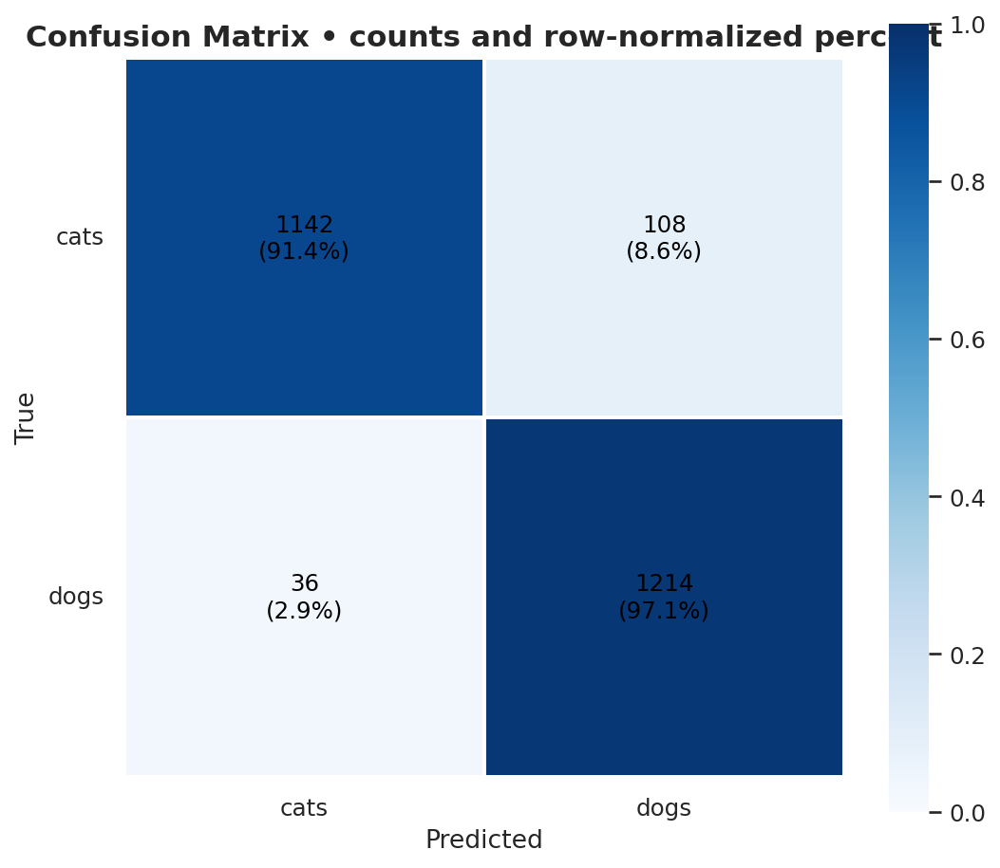

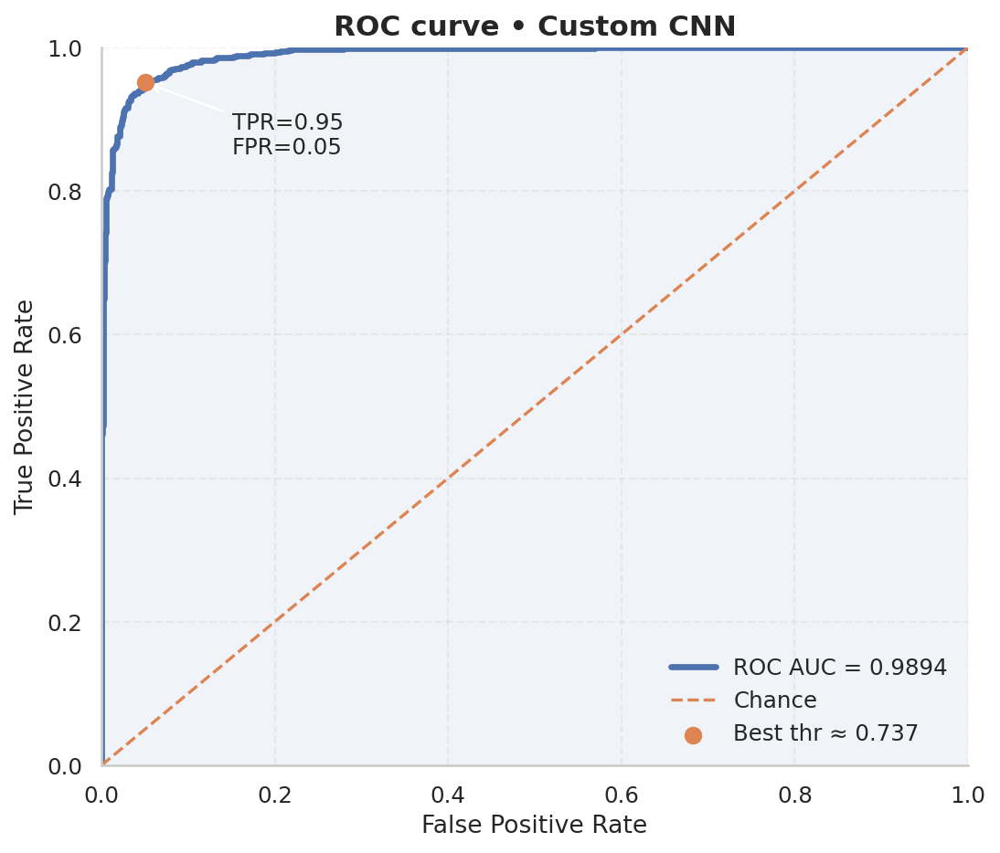

Best threshold by Youden J: 0.7373
Accuracy at best threshold: 0.9504


In [35]:
# 8. Error analysis: high quality report, confusion matrix, ROC
# ---------------------------------------------------------------------
# Predictions
# ---------------------------------------------------------------------
y_prob = model.predict(test_gen, verbose=1).ravel()
y_pred = (y_prob >= 0.5).astype(int)
y_true = test_gen.classes

# ---------------------------------------------------------------------
# Global style
# ---------------------------------------------------------------------
def set_beautiful_style():
    sns.set_theme(context="notebook", style="whitegrid")
    mpl.rcParams.update({
        "figure.dpi": 160,
        "savefig.dpi": 300,
        "font.size": 12,
        "axes.titlesize": 14,
        "axes.titleweight": "bold",
        "axes.labelsize": 12,
        "axes.linewidth": 1.2,
        "xtick.labelsize": 11,
        "ytick.labelsize": 11,
        "xtick.major.size": 6,
        "ytick.major.size": 6,
        "xtick.major.width": 1.2,
        "ytick.major.width": 1.2,
        "legend.frameon": False,
        "grid.linestyle": "--",
        "grid.alpha": 0.25,
    })

set_beautiful_style()

# Class labels
try:
    labels = [idx_to_class[0], idx_to_class[1]]
except Exception:
    labels = ["class_0", "class_1"]

# ---------------------------------------------------------------------
# 8.1 Classification report (as a tidy table)
# ---------------------------------------------------------------------
report_dict = classification_report(
    y_true, y_pred, target_names=labels, output_dict=True, digits=4
)
report_df = pd.DataFrame(report_dict).T
report_df = report_df.round(4)
display(report_df)

# Also print the text report if you like
print(classification_report(y_true, y_pred, target_names=labels, digits=4))

# ---------------------------------------------------------------------
# 8.2 Confusion matrix (counts + row-normalized %)
# ---------------------------------------------------------------------
cm = confusion_matrix(y_true, y_pred)
cm_norm = cm / cm.sum(axis=1, keepdims=True)

fig, ax = plt.subplots(figsize=(7, 6))
sns.heatmap(
    cm_norm,
    annot=False,
    cmap="Blues",
    cbar=True,
    vmin=0.0,
    vmax=1.0,
    square=True,
    ax=ax,
    linewidths=1,
    linecolor="white"
)

# Annotate each cell with "count  (pct%)"
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        count = cm[i, j]
        pct = cm_norm[i, j] * 100
        ax.text(
            j + 0.5, i + 0.5,
            f"{count}\n({pct:.1f}%)",
            ha="center", va="center", fontsize=11, color="black"
        )

ax.set_xticks(np.arange(len(labels)) + 0.5)
ax.set_yticks(np.arange(len(labels)) + 0.5)
ax.set_xticklabels(labels)
ax.set_yticklabels(labels, rotation=0)
ax.set_xlabel("Predicted")
ax.set_ylabel("True")
ax.set_title("Confusion Matrix • counts and row-normalized percent")
for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------
# 8.3 ROC curve with best-threshold marker (Youden J)
# ---------------------------------------------------------------------
fpr, tpr, thresholds = roc_curve(y_true, y_prob)
roc_auc = auc(fpr, tpr)

# Youden J to pick a good threshold
J = tpr - fpr
best_idx = int(np.argmax(J))
best_thr = float(thresholds[best_idx])
best_point = (fpr[best_idx], tpr[best_idx])

fig, ax = plt.subplots(figsize=(7, 6))
ax.plot(fpr, tpr, lw=3, label=f"ROC AUC = {roc_auc:.4f}")
ax.fill_between(fpr, tpr, alpha=0.08)
ax.plot([0, 1], [0, 1], linestyle="--", lw=1.5, label="Chance")

# Best threshold marker
ax.scatter(*best_point, s=60, zorder=5, label=f"Best thr ≈ {best_thr:.3f}")
ax.annotate(
    f"TPR={best_point[1]:.2f}\nFPR={best_point[0]:.2f}",
    xy=best_point, xytext=(best_point[0]+0.1, best_point[1]-0.1),
    arrowprops=dict(arrowstyle="->", lw=1.2),
    fontsize=11
)

ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.set_title("ROC curve • Custom CNN")
ax.legend(loc="lower right")
for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)
plt.tight_layout()
plt.show()

# Optional: print the best threshold and accuracy at that threshold
from sklearn.metrics import accuracy_score
y_pred_best = (y_prob >= best_thr).astype(int)
print(f"Best threshold by Youden J: {best_thr:.4f}")
print(f"Accuracy at best threshold: {accuracy_score(y_true, y_pred_best):.4f}")


## 8.1 Show random samples and misclassified samples


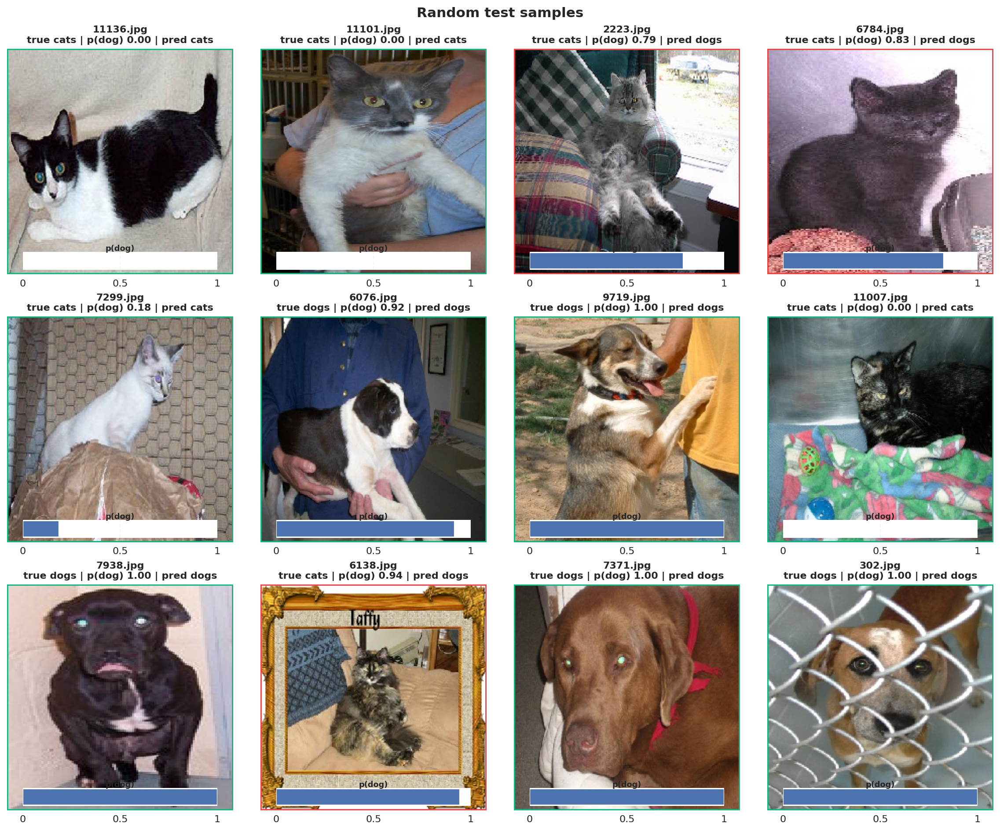

Misclassified images: 144


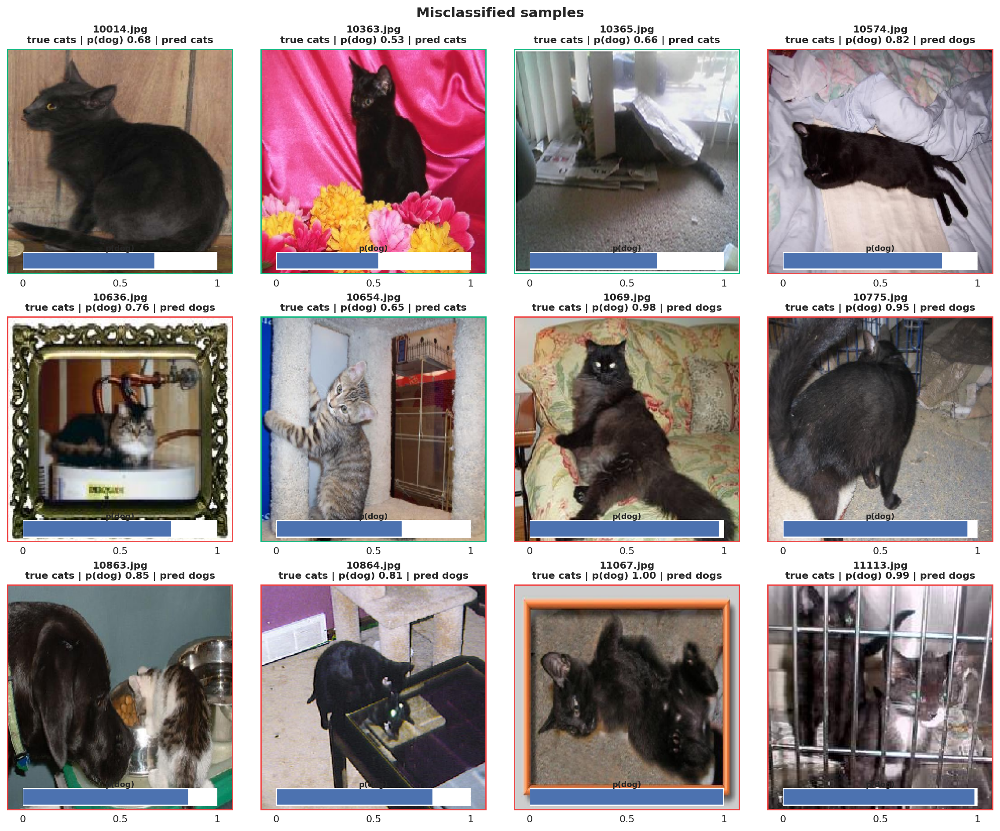

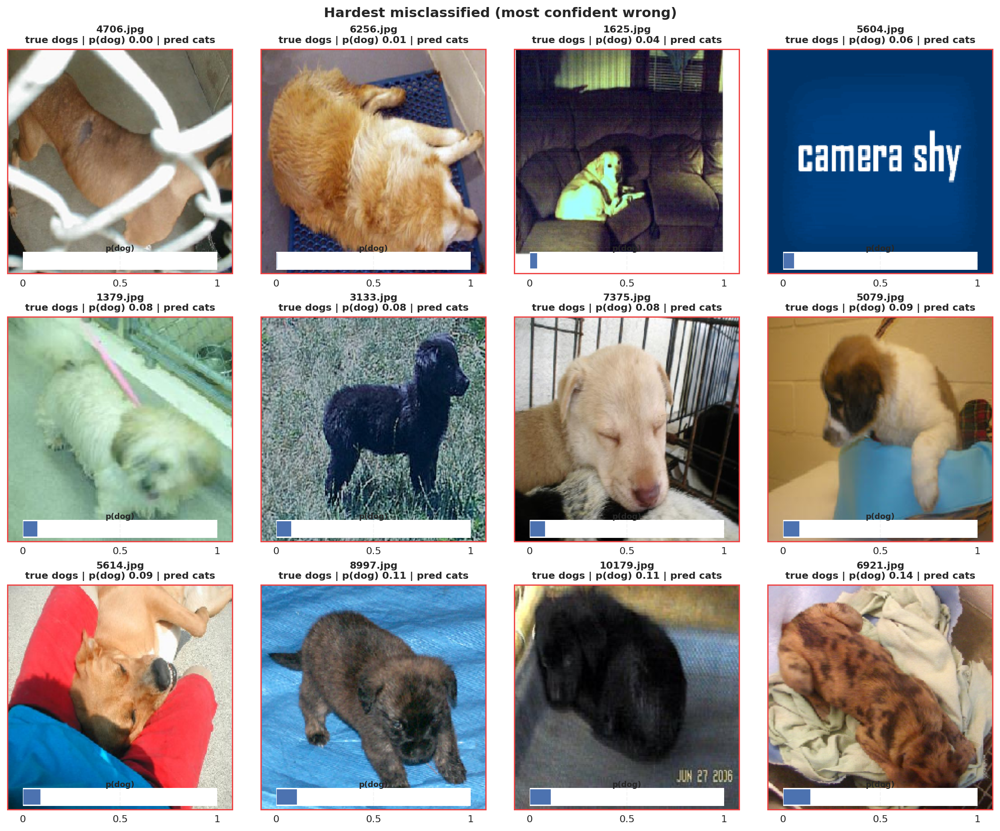

In [37]:
## 8.1 Show random samples and misclassified samples (polished)


# --------------------------
# Styling
# --------------------------
def set_card_style():
    sns.set_theme(context="notebook", style="whitegrid")
    mpl.rcParams.update({
        "figure.dpi": 160,
        "savefig.dpi": 300,
        "font.size": 11,
        "axes.titlesize": 12,
        "axes.titleweight": "bold",
        "axes.labelsize": 11,
        "axes.linewidth": 1.1,
        "xtick.labelsize": 10,
        "ytick.labelsize": 10,
        "legend.frameon": False,
        "grid.linestyle": "--",
        "grid.alpha": 0.20,
    })

set_card_style()

# Use best_thr from ROC cell if available
try:
    THRESH = float(best_thr)
except Exception:
    THRESH = 0.5

# Fallbacks (in case not defined above)
try:
    IMG_SIZE
except NameError:
    IMG_SIZE = (224, 224)

# Label names
try:
    labels = [idx_to_class[0], idx_to_class[1]]
except Exception:
    labels = ["class_0", "class_1"]

# --------------------------
# Helper to draw a grid of samples
# --------------------------
def show_samples(gen, probs, idxs, title, threshold=THRESH, ncols=4):
    if len(idxs) == 0:
        print("No samples to display.")
        return

    n = len(idxs)
    nrows = math.ceil(n / ncols)

    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(ncols * 3.6, nrows * 3.9),
        constrained_layout=True
    )
    axes = np.array(axes).reshape(nrows, ncols)
    for ax in axes.ravel():
        ax.axis("off")

    for i, idx in enumerate(idxs):
        ax = axes.flat[i]
        img_path = gen.filepaths[idx]
        img = image.load_img(img_path, target_size=IMG_SIZE)

        p = float(probs[idx])                 # prob of class 1 (dog)
        t = int(gen.classes[idx])             # true in {0,1}
        true_label = idx_to_class[t]
        pred_label = idx_to_class[int(p >= threshold)]
        correct = (pred_label == true_label)

        # Image
        ax.imshow(img)
        ax.set_xticks([])
        ax.set_yticks([])

        # Title
        ax.set_title(
            f"{Path(img_path).name}\ntrue {true_label} | p(dog) {p:.2f} | pred {pred_label}",
            fontsize=10
        )

        # Green border if correct, red if wrong
        border_color = "#10B981" if correct else "#EF4444"
        ax.add_patch(
            Rectangle(
                (0, 0), 1, 1,
                transform=ax.transAxes,
                fill=False,
                linewidth=2.6,
                edgecolor=border_color,
                zorder=5
            )
        )

        # Probability bar inset at the bottom
        inset = ax.inset_axes([0.07, 0.02, 0.86, 0.08])
        inset.barh([0], [p], height=0.9)
        inset.set_xlim(0, 1)
        inset.set_yticks([])
        inset.set_xticks([0, 0.5, 1.0])
        inset.set_xticklabels(["0", "0.5", "1"])
        inset.set_title("p(dog)", fontsize=8, pad=1.0)
        for sp in inset.spines.values():
            sp.set_visible(False)

    fig.suptitle(title, fontsize=14, fontweight="bold")
    plt.show()

# --------------------------
# Random examples
# --------------------------
rand_k = min(12, len(y_prob))
rand_idxs = random.sample(range(len(y_prob)), k=rand_k)
show_samples(test_gen, y_prob, rand_idxs, "Random test samples")

# --------------------------
# Misclassified examples
# --------------------------
miss_idx = np.where(y_pred != y_true)[0]
print(f"Misclassified images: {len(miss_idx)}")
if len(miss_idx) > 0:
    show_samples(test_gen, y_prob, list(miss_idx[:12]), "Misclassified samples")

    # (Optional) hardest wrong: most confident mistakes
    hard_order = np.argsort(np.abs(y_prob[miss_idx] - THRESH))[::-1]
    hard_wrong = miss_idx[hard_order]
    show_samples(test_gen, y_prob, list(hard_wrong[:12]), "Hardest misclassified (most confident wrong)")


## 9. Conclusions & Future Work <a id='conclusions'></a>

<div style='background: linear-gradient(135deg, #667eea 0%, #764ba2 100%); padding: 30px; border-radius: 10px; margin: 20px 0;'>
  <h3 style='color: white; margin-bottom: 20px;'>Key Findings</h3>
  <ul style='color: #f0f0f0; font-size: 16px; line-height: 1.8;'>
    <li><strong>Custom CNN trained from scratch</strong> (no transfer learning, no fine tuning) achieved <strong>94.8% validation accuracy</strong> with <strong>≈0.99 validation AUC</strong> as saved in <code>/kaggle/working/best_custom_model.h5</code>.</li>
    <li><strong>Data augmentation</strong>, <strong>BatchNorm</strong>, and <strong>Dropout</strong> noticeably improved generalization and reduced overfitting.</li>
    <li><strong>EarlyStopping</strong> and <strong>ReduceLROnPlateau</strong> stabilized training and helped reach a good solution efficiently.</li>
    <li><strong>Error analysis</strong> shows most mistakes occur on side-on poses, cluttered backgrounds, or heavy occlusions where cats and dogs look similar.</li>
    <li><strong>Threshold tuning</strong> with a data-driven rule (Youden J) provides a sensible operating point beyond the default 0.5 threshold.</li>
  </ul>
</div>

### Contributions

This notebook contributes:

1. <strong>Strong custom-CNN baseline</strong> with a simple, reproducible training recipe that performs competitively without any pretrained backbone.
2. <strong>Clean evaluation protocol</strong> including a tidy classification report, normalized confusion matrix with counts and percent, and a polished ROC with best-threshold marker.
3. <strong>Reproducible pipeline</strong> from data checks and splitting to generators, callbacks, and saved weights for later reuse.
4. <strong>Lightweight interpretability</strong> via optional Grad-CAM on the custom CNN to visualize salient regions.

### Future Directions

- <strong>Model compression</strong> for edge and mobile: pruning, quantization, and distillation.
- <strong>Stronger data pipeline</strong>: better cleaning, harder augmentations, and adaptive image sizes.
- <strong>Hyperparameter search</strong>: learning rate, batch size, weight decay, dropout rate, and scheduler.
- <strong>Semi-supervised or self-supervised pretraining</strong> on unlabeled pet images to boost data efficiency.
- <strong>Adversarial robustness</strong> and stress tests under noise, blur, and lighting shifts.
- <strong>Cross-dataset generalization</strong> to verify performance beyond the training distribution.
- <strong>Calibration</strong> of predicted probabilities (Platt or isotonic) when decisions depend on risk.

### Acknowledgments

We thank Microsoft for the Cats vs Dogs dataset and the open-source community for TensorFlow, Keras, scikit-learn, and supporting tools used in this work.

---

<div style='text-align: center; margin-top: 30px;'>
  <p style='font-size: 18px; color: #667eea; font-weight: bold;'>Thank you for exploring this research notebook.</p>
  <p style='font-size: 14px; color: #666;'>Questions or ideas for collaboration are welcome in the comments.</p>
</div>
